<a href="https://colab.research.google.com/github/JeppeLL/Thesis/blob/master/GAN_mode_collapse.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

TensorFlow 1.x selected.
1.15.2
/device:GPU:0


In [ ]:
import os
import glob
import pickle
import PIL
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import cv2 
from google.colab.patches import cv2_imshow
from IPython.display import clear_output

In [ ]:
os.chdir('/content/drive/My Drive/Thesis/stylegan2/')
import dnnlib
import dnnlib.tflib as tflib
import pretrained_networks

network_pkl='network-snapshot-015481.pkl'
print('Loading networks from "%s"...' % network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_pkl)

Loading networks from "network-snapshot-015481.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


In [ ]:
## Functions

def expand_seed(seeds, vector_size=512):
  result = []

  for seed in seeds:
    rnd = np.random.RandomState(seed)
    result.append( rnd.randn(1, vector_size) ) 
  return result
"""
def generate_zs_from_seeds(seeds,Gs):
    zs = []
    for seed_idx, seed in enumerate(seeds):
        rnd = np.random.RandomState(seed)
        z = rnd.randn(1, *Gs.input_shape[1:]) # [minibatch, component]
        zs.append(z)
    return zs
    
def convertZtoW(latent, Gs, truncation_psi=0.9, truncation_cutoff=9):
    dlatent = Gs.components.mapping.run(latent, None) # [seed, layer, component]
    dlatent_avg = Gs.get_var('dlatent_avg') # [component]
    for i in range(truncation_cutoff):
        dlatent[0][i] = (dlatent[0][i]-dlatent_avg)*truncation_psi + dlatent_avg
    return dlatent

def generate_ws_from_seeds(seeds,Gs):
    zs = generate_zs_from_seeds(seeds,Gs)
    ws=list()
    for i,z in enumerate(zs):
        w=convertZtoW(z, Gs, truncation_psi=1.0)
        #w=w[0,0,:]
        #print(w)
        if i % 500 == 0:
            print(f"Progress: {i} of {len(zs)}")
            print(w.shape)
        ws.append(w)
    return ws

def generate_images_in_w_space(dlatents, Gs, truncation_psi=1.0):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    Gs_kwargs.truncation_psi = truncation_psi
    #dlatent_avg = Gs.get_var('dlatent_avg') # [component]

    imgs = []

    for i in range(len(dlatents)):
        if i%500==0:
            #clear_output(wait=True)
            print(f"Progress: {i} out of {len(dlatents)}")
        correct_shape = np.tile(dlatents[i],[1,14,1])
        #correct_shape = np.squeeze([np.float32(w_i)],axis=0)
            
        row_images = Gs.components.synthesis.run(correct_shape,  **Gs_kwargs)
        imgs.append(Image.fromarray(row_images[0], 'RGB'))
        #imgs.append(imgs_w_i)
    return imgs

"""
def from_ws_to_df(ws):
    ws_0=[]
    for ws_i in ws:
        ws_0.append(ws_i[0,0,:])
    df = pd.DataFrame(data=ws_0)
    column_names = ['w'+str(n) for n in range(len(ws_0[0]))]
    df.columns=column_names
    return df

def list_of_PIL_to_np(images):
  length=len(images)
  out = np.zeros((length,256,256,3))
  for i in range(length):
    img_np = np.asarray(images[i])
    out[i] = img_np
  return out.astype(np.uint8)

def PCA_scatter_plot_2d(ws_pca,n_components,main_title=None,colors=None,alpha=1):
  n_subplots=n_components*(n_components-1)//2
  fig,axes=plt.subplots(nrows=1,ncols=n_subplots,figsize=(5*n_subplots,5))
  #plt.title(f"Principal Component Analysis")
  fig.suptitle(main_title)
  count=0
  for i in range(n_components-1):
    for j in range(i+1,n_components):
      axes[count].scatter(ws_pca[:,i],ws_pca[:,j],c=colors,alpha=alpha)
      axes[count].set_xlabel(f"pc{i}")
      axes[count].set_ylabel(f"pc{j}")
      count+=1
  plt.tight_layout()
  fig.subplots_adjust(top=0.88)
  plt.show()

def PCA_scatter_plot_2d(ws_pca,n_components,main_title=None,colors=None,
                        alpha=1,paths=False,figsize_scale=4,
                        pca_lim=None):
  if n_components%2!=0:
    print(f"Code is implemented for an even number of components.\nChanging n_components from {n_components} to {n_components-1}")
    n_components-=1
  components=np.array(list(range(n_components))).reshape(-1,2)
  n_subplots=n_components//2
  #n_subplots=n_components*(n_components-1)//2
  fig,axes=plt.subplots(nrows=1,ncols=n_subplots,figsize=(figsize_scale*n_subplots,figsize_scale))
  #plt.title(f"Principal Component Analysis")
  fig.suptitle(main_title)
  count=0
  for i,j in components:
  #for i in range(n_components-1):
    #for j in range(i+1,n_components):
      axes[count].scatter(ws_pca[:,i],ws_pca[:,j],c=colors,alpha=alpha)
      axes[count].set_xlabel(f"pc{i}")
      axes[count].set_ylabel(f"pc{j}")
      if pca_lim:
        axes[count].set_xlim(left=pca_lim[i][0],right=pca_lim[i][1])
        axes[count].set_ylim(bottom=pca_lim[j][0],top=pca_lim[j][1])
      
      if paths:
        for k in paths: #(10, 2, 5)
          #print()
          #print(f"k[i] = {k[i]}")
          #print(f"q[j] = {q[j]}")
          #print([k[0,i],k[0,j]])
          #print([k[1,i],k[1,j]])
          axes[count].plot([k[0,i],k[0,j]], [k[1,i],k[1,j]], 'k-', lw=2)
      count+=1
  plt.tight_layout()
  fig.subplots_adjust(top=0.88)
  plt.show()

def compare_scatter(training_data,focus_data,n_components,paths=False,figsize_scale=4):
  full_data = np.append(training_data,
                        focus_data,
                        axis=0)

  full_data_labels = np.append(np.repeat('yellow',len(training_data)),
                               np.repeat('red',len(focus_data)))
                               #np.linspace(1,10,num=len(focus_data)))
  
  
  PCA_scatter_plot_2d(full_data,n_components,alpha=0.6,colors=full_data_labels,paths=paths,figsize_scale=figsize_scale)



# Load training data
- and convert to grayscale

In [ ]:
def load_filenames_and_rotate_and_grayscale(filenames,num_of_rotations):
  rotations=np.random.rand(len(filenames)*num_of_rotations)*360
  images=list()
  for idx,filename in enumerate(filenames):
    if idx%20==0:
      clear_output(wait=True)
      print(f"Progress: {idx} out of {len(filenames)}")
    img = Image.open(filename)
    img = img.convert('L') #We convert to grayscale
    for j in range(num_of_rotations):
      img = img.rotate(rotations[idx*num_of_rotations+j],
                Image.BILINEAR)
      images.append(np.asarray(img))
  return images

## Load training images
filenames_accepted=glob.glob(os.path.join('/content/drive/My Drive/Thesis/training_images','accepted','*_rl.jpg'))
filenames_rejected=glob.glob(os.path.join('/content/drive/My Drive/Thesis/training_images','rejected','*'))

#We need to perform the same data augmentation we did to the training data, 
# when we used it to train the GAN
np.random.seed(0)
num_of_rotations=4 #should be enough

# Rejected
print(len(filenames_rejected))
training_rejected = load_filenames_and_rotate_and_grayscale(filenames_rejected,num_of_rotations)
#rotations=np.random.rand(len(filenames_rejected)*num_of_rotations)*360
#images_rejected=list()
#for idx,filename in enumerate(filenames_rejected):
#  if idx%20==0:
#    clear_output(wait=True)
#    print(f"Progress: {idx} out of {len(filenames_rejected)}")
#  img = Image.open(filename)
#  img = img.convert('L') #We convert to grayscale
#  for j in range(num_of_rotations):
#    img = img.rotate(rotations[idx*num_of_rotations+j],
#               Image.BILINEAR)
#    images_rejected.append(np.asarray(img))
    

# Accepted
print(len(filenames_accepted))
training_accepted = load_filenames_and_rotate_and_grayscale(filenames_accepted,num_of_rotations)
"""
rotations=np.random.rand(len(filenames_accepted)*num_of_rotations)*360
images_accepted=list()
for idx,filename in enumerate(filenames_accepted):
  if idx%20==0:
    clear_output(wait=True)
    print(f"Progress: {idx} out of {len(filenames_accepted)}")
  img = Image.open(filename)
  img = img.convert('L') #We convert to grayscale
  for j in range(num_of_rotations):
    img = img.rotate(rotations[idx*num_of_rotations+j],
                Image.BILINEAR)
    images_accepted.append(np.asarray(img))
"""

#Gather accepted and rejected
training_rejected = np.array(training_rejected)
training_accepted = np.array(training_accepted)
training_images=np.append(training_rejected,
                          training_accepted,
                          axis=0)
training_labels=np.append(np.repeat(1,len(training_rejected)),
                          np.repeat(0,len(training_accepted)),
                          axis=0)


print(training_images.shape)
print(training_labels.shape)
#del images_rejected, images_accepted

Progress: 100 out of 108
(3940, 256, 256)
(3940,)


# Load validation data

In [ ]:
filenames_accepted=glob.glob(os.path.join('/content/drive/My Drive/Thesis/validation_images','accepted','*_rl.jpg'))
filenames_rejected=glob.glob(os.path.join('/content/drive/My Drive/Thesis/validation_images','rejected','*'))


np.random.seed(0)
num_of_rotations=4 #should be enough

# Rejected
print(len(filenames_rejected))
validation_rejected = load_filenames_and_rotate_and_grayscale(filenames_rejected,num_of_rotations)

# Accepted
print(len(filenames_accepted))
validation_accepted = load_filenames_and_rotate_and_grayscale(filenames_accepted,num_of_rotations)


validation_rejected = np.array(validation_rejected)
validation_accepted = np.array(validation_accepted)
validation_images=np.append(validation_rejected,
                          validation_accepted,
                          axis=0)
validation_labels=np.append(np.repeat(1,len(validation_rejected)),
                          np.repeat(0,len(validation_accepted)),
                          axis=0)

Progress: 180 out of 200


# Load test data

In [ ]:
filenames_accepted=glob.glob(os.path.join('/content/drive/My Drive/Thesis/test_images','accepted','*_rl.jpg'))
filenames_rejected=glob.glob(os.path.join('/content/drive/My Drive/Thesis/test_images','rejected','*'))


np.random.seed(0)
num_of_rotations=4 #should be enough

# Rejected
print(len(filenames_rejected))
test_rejected = load_filenames_and_rotate_and_grayscale(filenames_rejected,num_of_rotations)

# Accepted
print(len(filenames_accepted))
test_accepted = load_filenames_and_rotate_and_grayscale(filenames_accepted,num_of_rotations)


test_rejected = np.array(test_rejected)
test_accepted = np.array(test_accepted)
test_images=np.append(test_rejected,
                          test_accepted,
                          axis=0)
test_labels=np.append(np.repeat(1,len(test_rejected)),
                          np.repeat(0,len(test_accepted)),
                          axis=0)

Progress: 160 out of 169


# Make PCA plots of training, val and test with split on positive/negative

In [ ]:
pca = pickle.load(open('/content/drive/My Drive/Thesis/PCA/pca_original_data_gray.pkl','rb'))

In [ ]:
def PCA_pixel_preprocess(images):
  #Convert from RGB to Grayscale
  if images.ndim == 4:
    print(images.shape)
    print(f"Images has {images.ndim} dimensions! Converting to grayscale")
    images_temp = []
    for image in images:
      img = Image.fromarray(image).convert('L')
      img = np.asarray(img)
      images_temp.append(img)
    images = np.array(images_temp)
    print(images.shape)

  #Reshape
  images = np.reshape(images, (len(images), -1))
  print(images.shape)
  #Normalize
  images = images/255.
  return images

training_images_gray = PCA_pixel_preprocess(training_images)
validation_images_gray = PCA_pixel_preprocess(validation_images)
test_images_gray = PCA_pixel_preprocess(test_images)

training_images_pca = pca.transform(training_images_gray)
validation_images_pca = pca.transform(validation_images_gray)
test_images_pca = pca.transform(test_images_gray)


PCA_scatter_plot_2d(training_images_pca,14,
                    main_title=f"Training data - rejected images (blue) and accepted images (red) ",
                    colors=training_labels,
                    alpha=0.2,
                    figsize_scale=5)
PCA_scatter_plot_2d(validation_images_pca,14,
                    main_title=f"Validation data - rejected images (blue) and accepted images (red) ",
                    colors=validation_labels,
                    alpha=0.2,
                    figsize_scale=5)
PCA_scatter_plot_2d(test_images_pca,14,
                    main_title=f"Test data - rejected images (blue) and accepted images (red) ",
                    colors=test_labels,
                    alpha=0.2,
                    figsize_scale=5)

# Perform PCA on pixelspace

In [ ]:
## Perform PCA on training images
def PCA_pixel_preprocess(images):
  #Convert from RGB to Grayscale
  if images.ndim == 4:
    print(images.shape)
    print(f"Images has {images.ndim} dimensions! Converting to grayscale")
    images_temp = []
    for image in images:
      img = Image.fromarray(image).convert('L')
      img = np.asarray(img)
      images_temp.append(img)
    images = np.array(images_temp)
    print(images.shape)

  #Reshape
  images = np.reshape(images, (len(images), -1))
  print(images.shape)
  #Normalize
  images = images/255.
  return images

training_images_gray = PCA_pixel_preprocess(training_images)

# fit PCA transformation
pca = PCA(n_components=14)     #,svd_solver='randomized') #lets aim to capture 50% of the variance in the data
pca.fit(PCA_pixel_preprocess(training_images))

# apply PCA transformation
training_images_pca=pca.transform(training_images_gray)

#Look at number of components needed to capture 50% of data variance
print(f"training_images_pca.shape: {training_images_pca.shape}")

# Save PCA object
pickle.dump(open('/content/drive/My Drive/Thesis/PCA/pca_training_data_gray.pkl','wb'))

(3940, 65536)
(3940, 65536)
training_images_pca.shape: (3940, 14)


# Sidestep: PCA of training data

(432, 65536)
(3508, 65536)


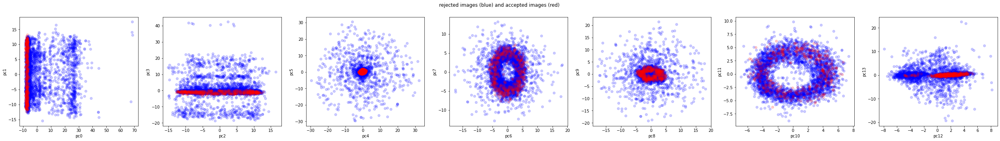

In [ ]:
## PCA plot of accepted / rejected images

training_accepted_gray = PCA_pixel_preprocess(training_accepted)
training_rejected_gray = PCA_pixel_preprocess(training_rejected)
# apply PCA transformation
training_accepted_pca=pca.transform(training_accepted_gray)
training_rejected_pca=pca.transform(training_rejected_gray)

def pca_plot():
  all_images_pca = np.append(training_rejected_pca,
                            training_accepted_pca,
                            axis=0)
  all_images_pca_label = np.append(np.repeat('b',len(training_rejected_pca)),
                                  np.repeat('r',len(training_accepted_pca)))

  PCA_scatter_plot_2d(all_images_pca,14,
                      main_title=f"rejected images (blue) and accepted images (red) ",
                      colors=all_images_pca_label,
                      alpha=0.2,
                      figsize_scale=5)
pca_plot()

In [ ]:
#Lets see what the pca-components really mean
import pandas as pd

def get_images_from_each_pca_subset(training_images_pca,n_subsets,pca,training_images,pca_reconstruction=False):
  pca_df = pd.DataFrame(data=training_images_pca,columns=['pc'+str(i) for i in range(14)])
  pc_quantiles = np.linspace(np.min(training_images_pca,axis=0),np.max(training_images_pca,axis=0),num=n_subsets+1)
  #pc_quantiles = np.quantile(training_images_pca,[i*0.10 for i in range(1,11)],0)

  #Split df into subsets where pc_i is between quantile_a and quantile_b, and where pc_j is between quantile_c and quantile_d
  # and then select a random image from that subset
  colnames=np.array(['pc'+str(i) for i in range(14)])
  colname_pairs = np.reshape(colnames,(-1,2))
  plots_imgs = list()
  plots_imgs_sum = list()
  plots_imgs_coords = list()
  for i in range(len(colname_pairs)):
    imgs=list()
    imgs_sum = list()
    imgs_coords = list()
    for j in range(len(pc_quantiles)-1):
      for k in range(len(pc_quantiles)-1):
          
        pc_a = colname_pairs[i,0]
        pc_b = colname_pairs[i,1]
        
        idx_0 = (pca_df[pc_a] <= pc_quantiles[k+1,i*2])
        idx_1 = (pca_df[pc_a] >  pc_quantiles[k  ,i*2])
        idx_2 = (pca_df[pc_b] <= pc_quantiles[j+1,i*2+1])
        idx_3 = (pca_df[pc_b] >  pc_quantiles[j  ,i*2+1])
        idx_a = np.logical_and(idx_0,idx_1)
        idx_b = np.logical_and(idx_2,idx_3)
        idx_c = np.logical_and(idx_a,idx_b)
        idx = pca_df[idx_c].index
        #print(pc_a+' + '+pc_b)
        #print(j)
        #print(k)
        imgs_sum.append(len(idx))
        if len(idx)>0:
          subset_example = np.random.choice(idx,1)
          if pca_reconstruction:
            #Get the principal components
            get_image = pca_df.loc[subset_example,[pc_a,pc_b]].values
            #Inverse transform to pixel data
            get_image = np.dot(get_image, pca.components_[i*2:(i*2)+2]) + pca.mean_
            #Reshape to (1,256,256)
            get_image = np.reshape(get_image,(1,256,256))
          else:
            get_image = training_images[subset_example]
            #Reshape to (1,256,256)
            get_image = np.reshape(get_image,(1,256,256))
          #plt.imshow(get_image[0])
          #plt.show()
          imgs_coords.append(pca_df.loc[subset_example,[pc_a,pc_b]].values)
        else:
          get_image = np.zeros((1,256,256))
          #plt.imshow(get_image[0])
          #plt.show()
          imgs_coords.append(np.array([[np.nan,np.nan]]))
        #print(type(get_image[0]))
        imgs.append(get_image[0])
    plots_imgs.append(imgs)
    plots_imgs_sum.append(imgs_sum)
    plots_imgs_coords.append(imgs_coords)
    #break
  #print(np.array(plots_imgs_coords).shape)
  return plots_imgs,plots_imgs_sum,plots_imgs_coords,pc_quantiles


def show_images_from_pca_subsets(pca_plot_id,pc_quantiles,plots_imgs,plots_imgs_coords,show_coords=False):
  #quantiles_x = pc_quantiles[:,pca_plot_id*2]
  #quantiles_y = pc_quantiles[:,pca_plot_id*2+1]
  #pca_plot_id*2+1
  rows=len(pc_quantiles)-1
  cols=len(pc_quantiles)-1
  fig,axes = plt.subplots(nrows=rows,ncols=rows,figsize=(10,10))
  fig.suptitle(f"PCA locations of images - component {pca_plot_id*2} (x-axis) and component {pca_plot_id*2+1} (y-axis)")
  idx=0
  for ax in axes.flat:
    ax.imshow(plots_imgs[pca_plot_id][idx],cmap='gray')
    if show_coords:
      ax.set_xticks([130])
      ax.set_xticklabels(["{:.1f}".format(plots_imgs_coords[pca_plot_id][idx][0][0])])
      ax.set_yticks([130])
      ax.set_yticklabels(["{:.1f}".format(plots_imgs_coords[pca_plot_id][idx][0][1])])
    else:
      ax.set_xticks([])
      ax.set_yticks([])
    idx+=1
  plt.tight_layout()
  plt.subplots_adjust(top=0.95)
  plt.show()

## PCA reconstructions located on PCA axis

In [ ]:
plots_imgs,plots_imgs_sum,plots_imgs_coords,pc_quantiles = get_images_from_each_pca_subset(training_images_pca,7,
                                                                                           pca,
                                                                                           training_images_gray,
                                                                                           pca_reconstruction=True)

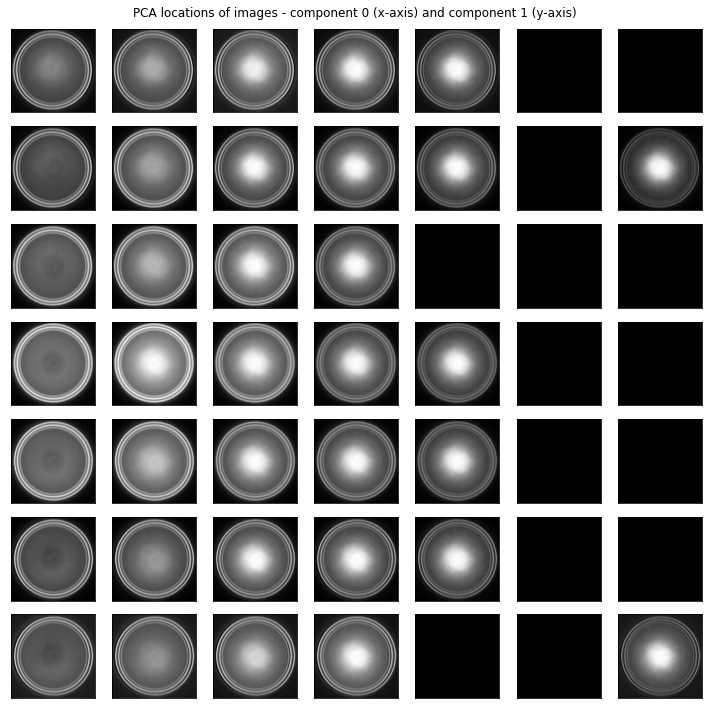

In [ ]:
#PCA - component 0 (x-axis) and 1 (y-axis)
show_images_from_pca_subsets(0,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(1,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(2,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(3,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(4,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(5,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(6,pc_quantiles,plots_imgs,plots_imgs_coords)

## Images located on PCA axis

In [ ]:
plots_imgs,plots_imgs_sum,plots_imgs_coords,pc_quantiles = get_images_from_each_pca_subset(training_images_pca,7,
                                                                                           pca,
                                                                                           training_images_gray,
                                                                                           pca_reconstruction=False)

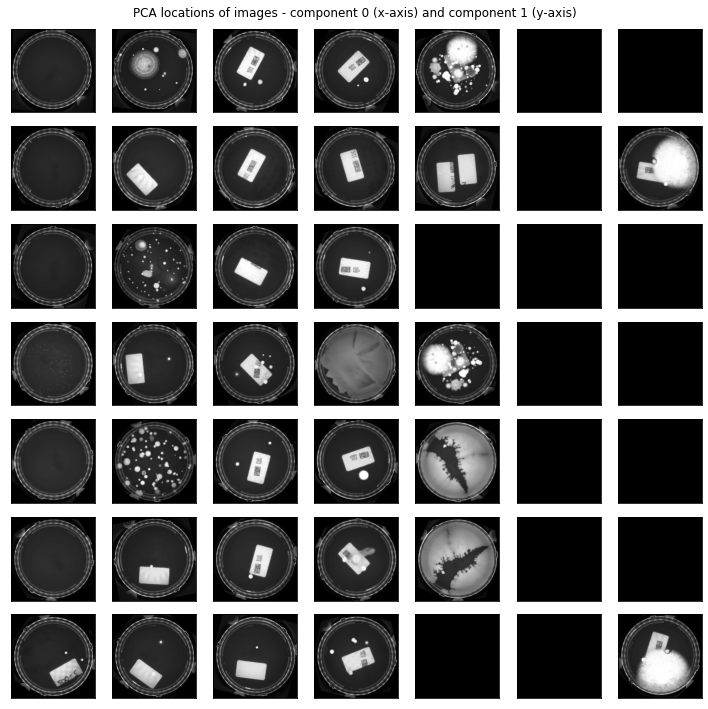

In [ ]:
show_images_from_pca_subsets(0,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(1,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(2,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(3,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(4,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(5,pc_quantiles,plots_imgs,plots_imgs_coords)

In [ ]:
show_images_from_pca_subsets(6,pc_quantiles,plots_imgs,plots_imgs_coords)

# Generate synthetic images and Ws

In [ ]:
def PCA_analysis(network_pkl):

  #Load the different network pickles
  os.chdir('/content/drive/My Drive/Thesis/stylegan2/')
  #network_pkl='network-snapshot-015481.pkl'
  print('Loading networks from "%s"...' % network_pkl)
  _G, _D, Gs = pretrained_networks.load_networks(network_pkl)
  #_G = None
  #Gs = None

  ## Now we run the functions to generate a given amount of random Ws and images
  print("Generating images")
  np.random.seed(0)
  seeds = np.array(range(1000))

  synthetic_ws = generate_ws_from_seeds(seeds,Gs)

  synthetic_ws_df = from_ws_to_df(synthetic_ws)
  print(f"ws_df.shape: {synthetic_ws_df.shape}")

  synthetic_ws = np.array(synthetic_ws)[:,0,0,:]
  print(f"ws.shape: {synthetic_ws.shape}")

  synthetic_images = generate_images_in_w_space(synthetic_ws,Gs)
  synthetic_images = list_of_PIL_to_np(synthetic_images)


  print(f"PCA processing...")
  synthetic_images = PCA_pixel_preprocess(synthetic_images)
  # apply PCA transformation
  synthetic_images_pca=pca.transform(synthetic_images)
  print(f"training_images.shape: {synthetic_images_pca.shape}")


  print(f"Plotting...")
  all_images_pca = np.append(training_images_pca,
                            synthetic_images_pca,
                            axis=0)
  all_images_pca_label = np.append(np.repeat('b',len(training_images_pca)),
                                  np.repeat('r',len(synthetic_images_pca)))
  
  pca_lim = list()
  for i in range(all_images_pca.shape[1]):
    min_max = np.array([ min(all_images_pca[:,i]),
                         max(all_images_pca[:,i]) ])
    pca_lim.append(min_max)
  #Plot
  title=network_pkl.split("/")[-1]
  
  PCA_scatter_plot_2d(all_images_pca,14,
                      main_title=f"{title} - training data (blue) and synthetic data (red) ",
                      colors=all_images_pca_label,
                      alpha=0.2,
                      figsize_scale=5,
                      pca_lim=pca_lim)
  PCA_scatter_plot_2d(training_images_pca,14,
                      main_title=f"{title} - training data ",
                      alpha=0.4,
                      figsize_scale=5,
                      pca_lim=pca_lim)
  PCA_scatter_plot_2d(synthetic_images_pca,14,
                      main_title=f"{title} - synthetic data ",
                      alpha=0.4,
                      figsize_scale=5,
                      pca_lim=pca_lim)
  
  

## Network pickle 

Loading networks from "network-snapshot-015481.pkl"...
Generating images
Progress: 0 of 1000
(1, 14, 512)
Progress: 500 of 1000
(1, 14, 512)
ws_df.shape: (1000, 512)
ws.shape: (1000, 512)
Progress: 0 out of 1000
Progress: 500 out of 1000
PCA processing...
(1000, 256, 256, 3)
Images has 4 dimensions! Converting to grayscale
(1000, 256, 256)
(1000, 65536)
training_images.shape: (1000, 14)
Plotting...


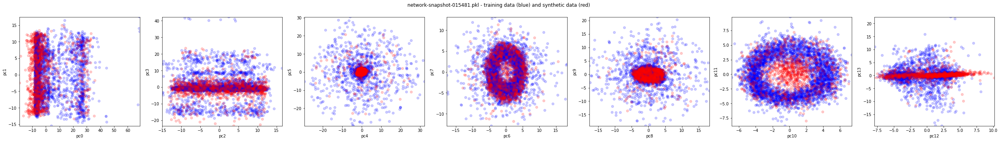

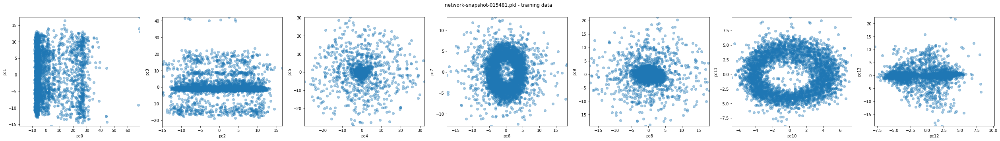

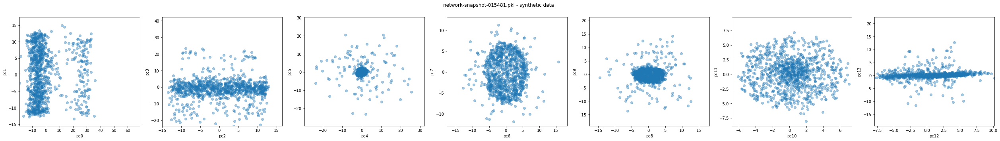

In [ ]:
PCA_analysis('network-snapshot-015481.pkl')

/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-012820.pkl
Loading networks from "/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-012820.pkl"...
Generating images
Progress: 0 of 1000
(1, 14, 512)
Progress: 500 of 1000
(1, 14, 512)
ws_df.shape: (1000, 512)
ws.shape: (1000, 512)
Progress: 0 out of 1000
Progress: 500 out of 1000
PCA processing...
(1000, 256, 256, 3)
Images has 4 dimensions! Converting to grayscale
(1000, 256, 256)
(1000, 65536)
training_images.shape: (1000, 14)
Plotting...


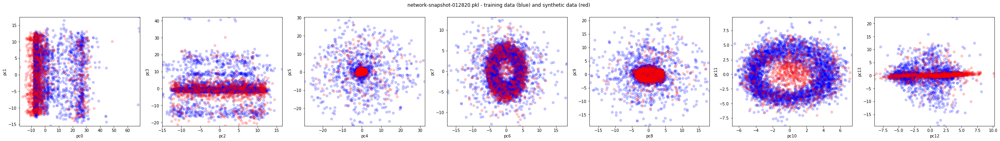

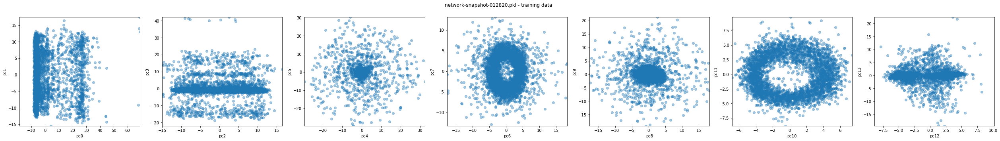

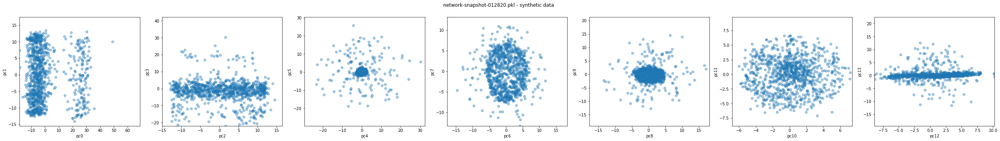

/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-011368.pkl
Loading networks from "/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-011368.pkl"...
Generating images
Progress: 0 of 1000
(1, 14, 512)
Progress: 500 of 1000
(1, 14, 512)
ws_df.shape: (1000, 512)
ws.shape: (1000, 512)
Progress: 0 out of 1000
Progress: 500 out of 1000
PCA processing...
(1000, 256, 256, 3)
Images has 4 dimensions! Converting to grayscale
(1000, 256, 256)
(1000, 65536)
training_images.shape: (1000, 14)
Plotting...


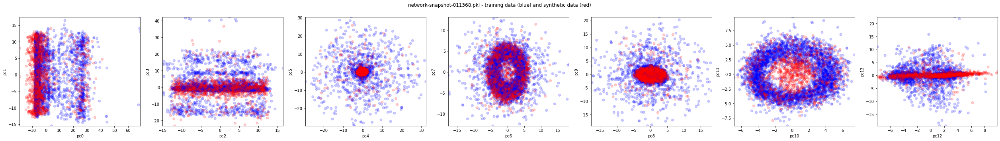

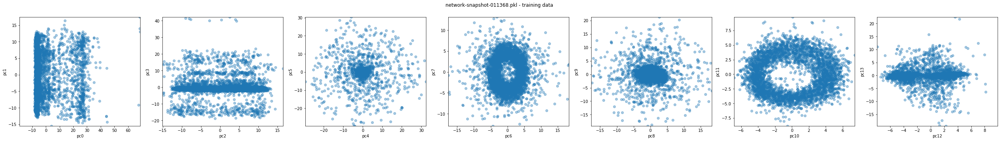

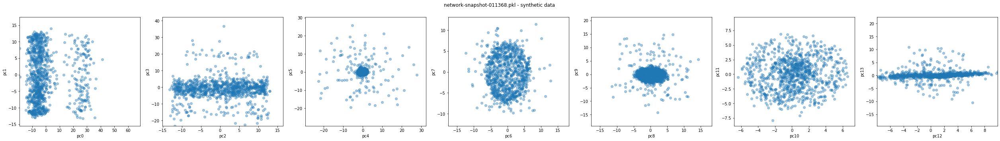

/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-009917.pkl
Loading networks from "/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-009917.pkl"...
Generating images
Progress: 0 of 1000
(1, 14, 512)
Progress: 500 of 1000
(1, 14, 512)
ws_df.shape: (1000, 512)
ws.shape: (1000, 512)
Progress: 0 out of 1000
Progress: 500 out of 1000
PCA processing...
(1000, 256, 256, 3)
Images has 4 dimensions! Converting to grayscale
(1000, 256, 256)
(1000, 65536)
training_images.shape: (1000, 14)
Plotting...


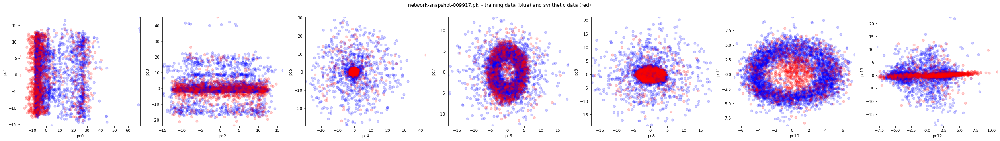

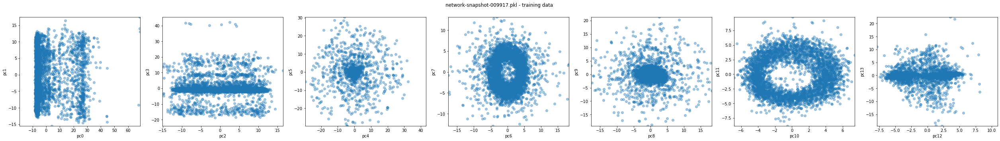

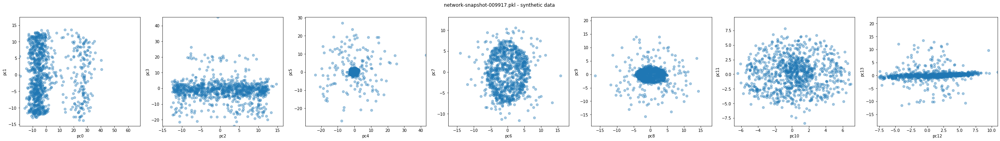

/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-014271.pkl
Loading networks from "/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-014271.pkl"...
Generating images
Progress: 0 of 1000
(1, 14, 512)
Progress: 500 of 1000
(1, 14, 512)
ws_df.shape: (1000, 512)
ws.shape: (1000, 512)
Progress: 0 out of 1000
Progress: 500 out of 1000
PCA processing...
(1000, 256, 256, 3)
Images has 4 dimensions! Converting to grayscale
(1000, 256, 256)
(1000, 65536)
training_images.shape: (1000, 14)
Plotting...


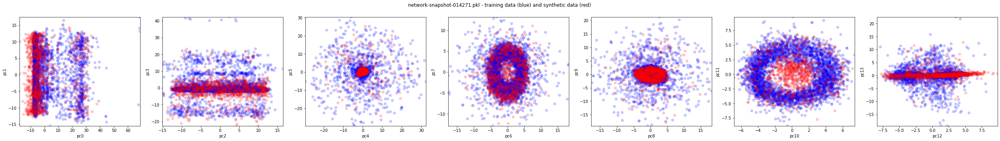

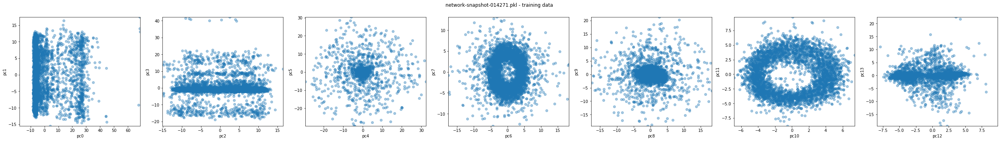

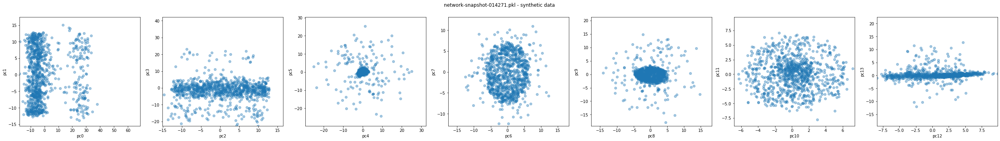

In [ ]:
network_pickles = glob.glob(os.path.join('/content/drive/My Drive/Thesis/stylegan2/network_pickles','*'))
for pickle in network_pickles:
  print(pickle)
  PCA_analysis(pickle)

# Conclusion
PCA does not show total mode collapse. Some of the plots show a slight concentration of synthetic data points compared to training data points, but not enough that we consider it very destructive to the functionality of the generator.

# Second check - visual
- Just print some of the synthetic images generated by the various networks

In [ ]:
def visual_analysis(network_pkl):

  #Load the different network pickles
  os.chdir('/content/drive/My Drive/Thesis/stylegan2/')
  #network_pkl='network-snapshot-015481.pkl'
  print('Loading networks from "%s"...' % network_pkl)
  _G, _D, Gs = pretrained_networks.load_networks(network_pkl)
  #_G = None
  #Gs = None

  ## Now we run the functions to generate a given amount of random Ws and images
  print("Generating images")
  np.random.seed(0)
  seeds = np.array(range(50))

  synthetic_ws = generate_ws_from_seeds(seeds,Gs)

  synthetic_ws_df = from_ws_to_df(synthetic_ws)
  print(f"ws_df.shape: {synthetic_ws_df.shape}")

  synthetic_ws = np.array(synthetic_ws)[:,0,0,:]
  print(f"ws.shape: {synthetic_ws.shape}")

  synthetic_images = generate_images_in_w_space(synthetic_ws,Gs)
  synthetic_images = list_of_PIL_to_np(synthetic_images)

  #subplots
  fig,axes = plt.subplots(nrows=10, ncols=5, figsize=(15,30))
  fig.suptitle(network_pkl.split("/")[-1])
  for idx,ax in enumerate(axes.flat):
    ax.imshow(synthetic_images[idx])
  plt.show()

Loading networks from "network-snapshot-015481.pkl"...
Generating images
Progress: 0 of 50
(1, 14, 512)
ws_df.shape: (50, 512)
ws.shape: (50, 512)
Progress: 0 out of 50


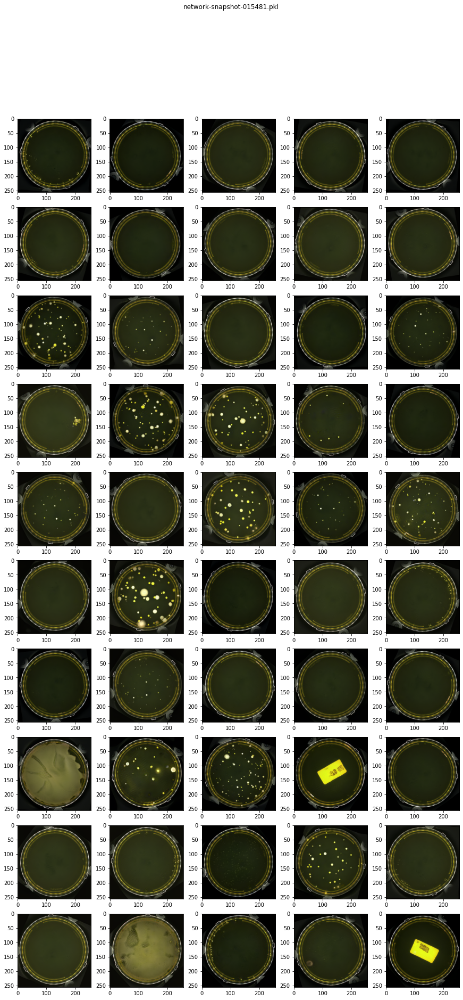

/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-009917.pkl
Loading networks from "/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-009917.pkl"...
Generating images
Progress: 0 of 50
(1, 14, 512)
ws_df.shape: (50, 512)
ws.shape: (50, 512)
Progress: 0 out of 50


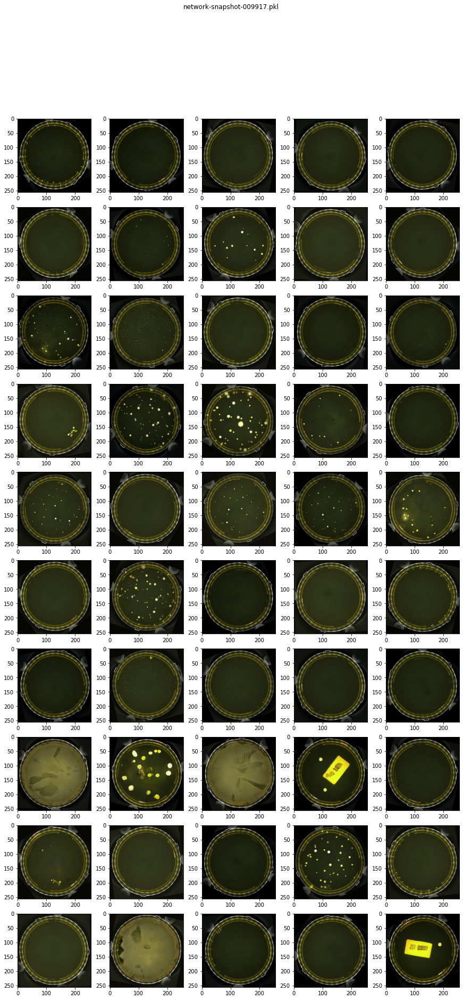

/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-011368.pkl
Loading networks from "/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-011368.pkl"...
Generating images
Progress: 0 of 50
(1, 14, 512)
ws_df.shape: (50, 512)
ws.shape: (50, 512)
Progress: 0 out of 50


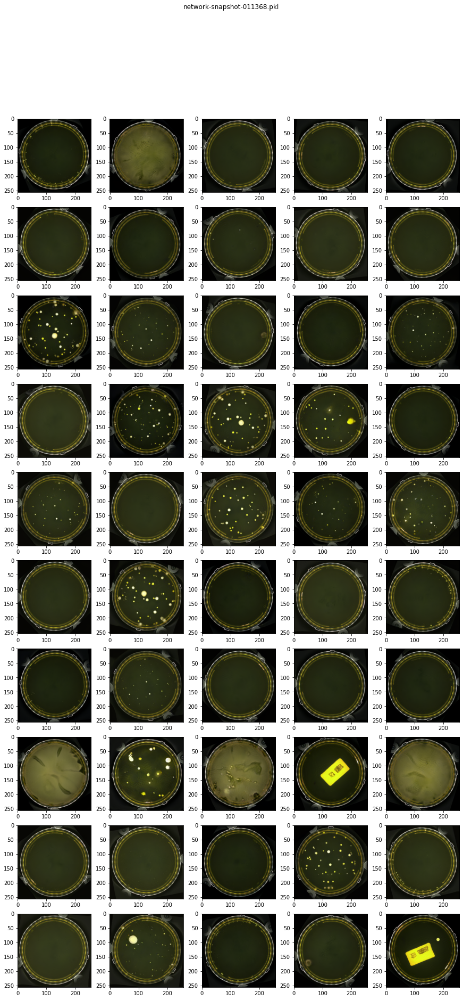

/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-012820.pkl
Loading networks from "/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-012820.pkl"...
Generating images
Progress: 0 of 50
(1, 14, 512)
ws_df.shape: (50, 512)
ws.shape: (50, 512)
Progress: 0 out of 50


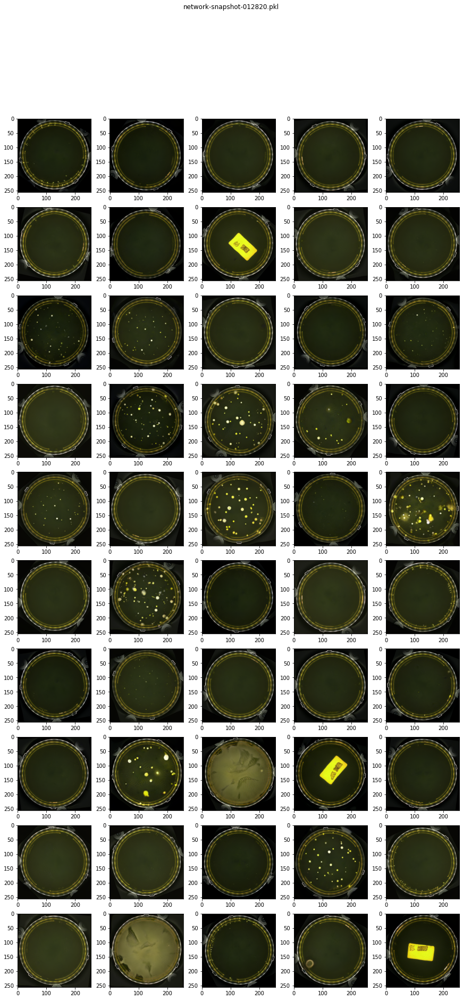

/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-014271.pkl
Loading networks from "/content/drive/My Drive/Thesis/stylegan2/network_pickles/network-snapshot-014271.pkl"...
Generating images
Progress: 0 of 50
(1, 14, 512)
ws_df.shape: (50, 512)
ws.shape: (50, 512)
Progress: 0 out of 50


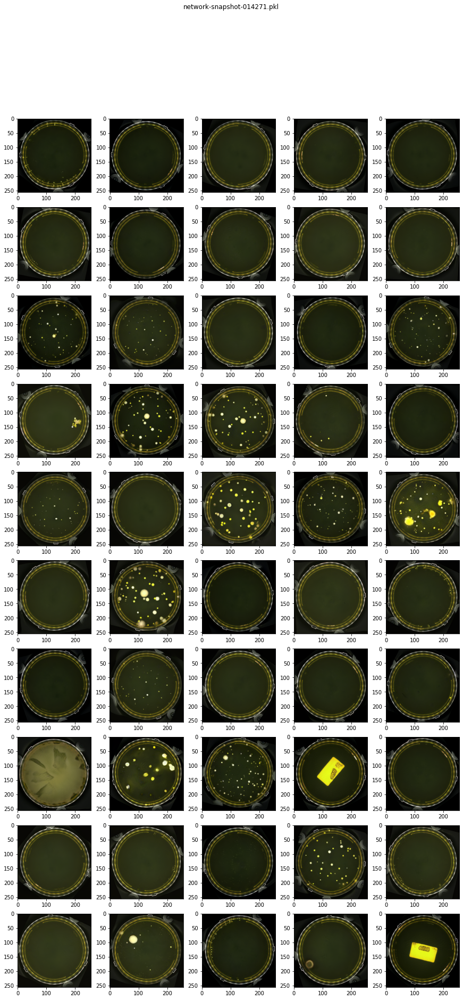

In [ ]:
visual_analysis('network-snapshot-015481.pkl')
network_pickles = glob.glob(os.path.join('/content/drive/My Drive/Thesis/stylegan2/network_pickles','*'))
for pickle in network_pickles:
  print(pickle)
  visual_analysis(pickle)

# Visual inspection - conclusion
We see that in the earlier networks, it is more common to see blurry bacteria, or bacteria that give off an unnatural light around it. This is not completely solved in the latest network, but it is better.